In [2]:
from scipy.io import loadmat, savemat
from math import pi
import pickle

import matplotlib.pyplot as plt
import torch
import pandas as pd
import seaborn as sns
import torchaudio

%load_ext autoreload
%autoreload 2
%matplotlib inline

from dstft import DSTFT, FDSTFT, entropy_loss, fast_sst, frequency_tracking

device = 'cuda' if torch.cuda.is_available() else 'cpu'
torch.manual_seed(1802);

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


torch.Size([40000])


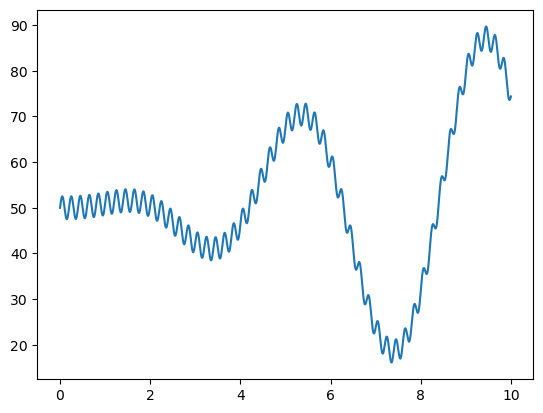

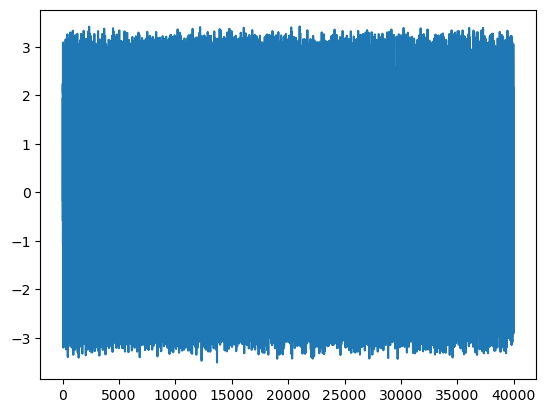

In [3]:
sr = 4_000; support = 750; stride = 100

freq = lambda t: 1.5*25 * torch.sin(1.5*t) * torch.hann_window(2*t.shape[0])[:t.shape[0]] + 50 + 2.5 * torch.sin(10*pi*t)

t = torch.arange(0, 20, 1/sr)[:int(20*sr/2)]
f = freq(t)
plt.plot(t, f)

phase = torch.cumsum(f/sr, dim=0) 
x = torch.sin( 1*2*pi*phase + 2*pi*torch.rand(t.shape)/sr)
x += torch.sin( 4*2*pi*phase + pi*2*torch.rand(t.shape)/sr)
x += torch.sin( 8*2*pi*phase + 2*pi*2*torch.rand(t.shape)/sr)
x += torch.sin( 16*2*pi*phase + 4*pi*2*torch.rand(t.shape)/sr)
x += 0.1 * torch.randn(x.shape)

plt.figure()
plt.plot(x)
x = x[None, ...].to(device)
print(f.shape)



In [4]:
# specs = {} 
# stfts = {}
# wins = {}
# losses = {} 
# f_hats = {} 
# ss = {} 
# losses2 = {} 
# f_hats2 = {} 
# mse = {} 
# mse2 = {} 

# with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_f_hats.pkl", "wb") as file: pickle.dump(f_hats, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_ss.pkl", "wb") as file: pickle.dump(ss, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_losses2.pkl", "wb") as file: pickle.dump(losses2, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_f_hats2.pkl", "wb") as file: pickle.dump(f_hats2, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_mse.pkl", "wb") as file: pickle.dump(mse, file, pickle.HIGHEST_PROTOCOL)
# with open("../tmp/3_mse2.pkl", "wb") as file: pickle.dump(mse2, file, pickle.HIGHEST_PROTOCOL)

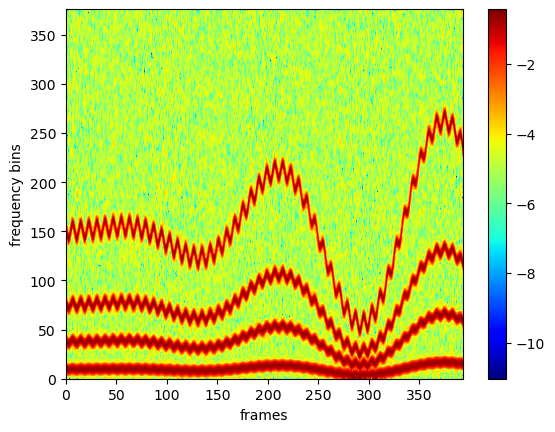

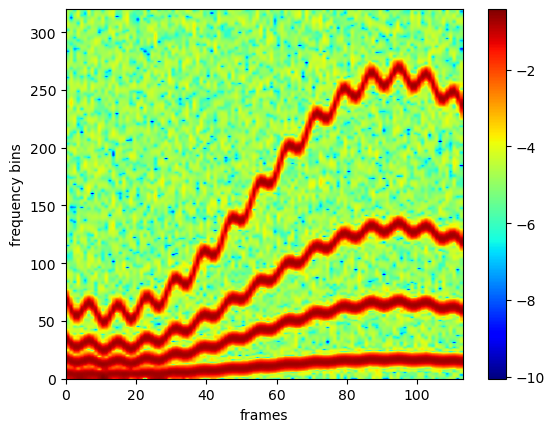

In [5]:
dstft = FDSTFT(x, win_length=200,  support=support, stride=stride, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
spec, stft, *_ = dstft(x)
dstft.print(spec, weights=False, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False) 

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['200'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['200'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['200'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['200'] = entropy_loss(spec).cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

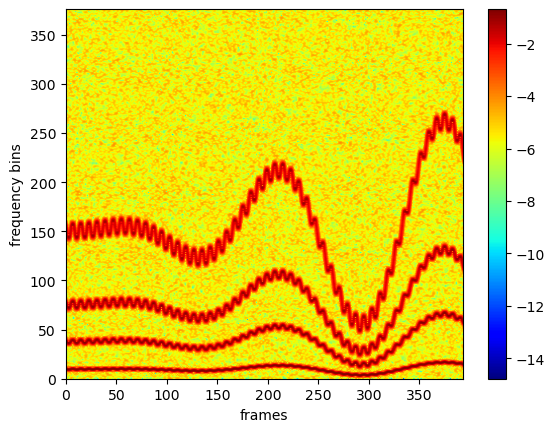

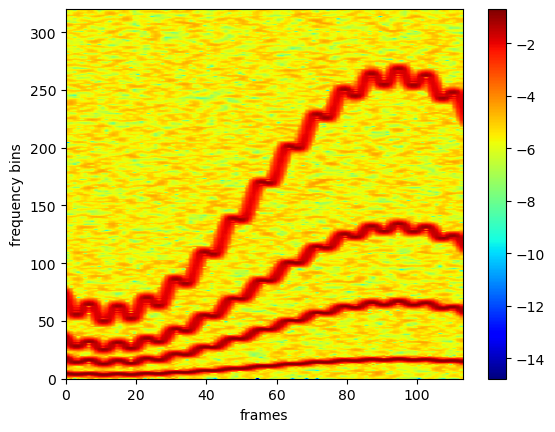

In [6]:
dstft = FDSTFT(x, win_length=650,  support=support, stride=stride, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
spec, stft, *_ = dstft(x)
dstft.print(spec, weights=False, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False) 

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['650'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['650'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['650'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['650'] = entropy_loss(spec).cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

Single window length

Epoch 00102: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00202: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00302: reducing learning rate of group 0 to 1.0000e-01.
301 473.1


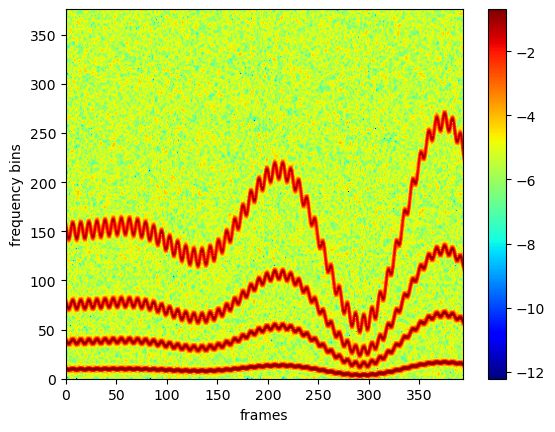

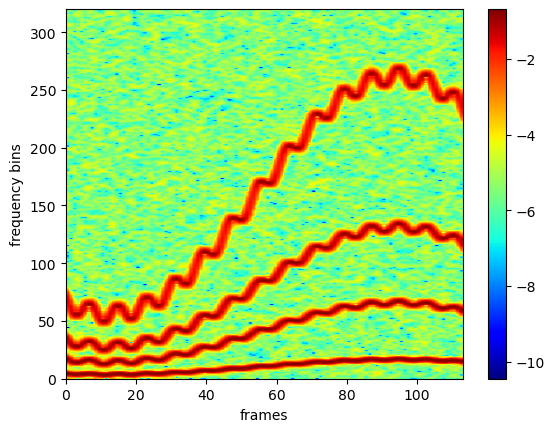

In [7]:
dstft = FDSTFT(x, win_length=577,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p=None, stride_p=None)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

min_err = 100
min_win = 0

for epoch in range(1_000):
    opt.zero_grad()    
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    err.backward()    
    opt.step()
    sch.step(err)
    
    if err < min_err:
        min_err = err
        min_win = dstft.win_length.item()
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch, f'{dstft.win_length.item():.1f}')
dstft.print(spec, x, bar=True, wins=False, weights=False)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\theta$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\theta$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\theta$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\theta$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

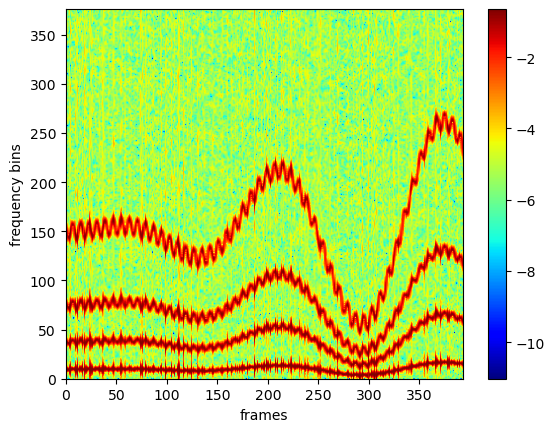

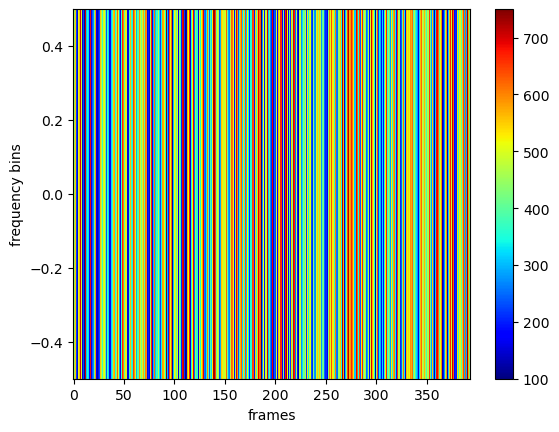

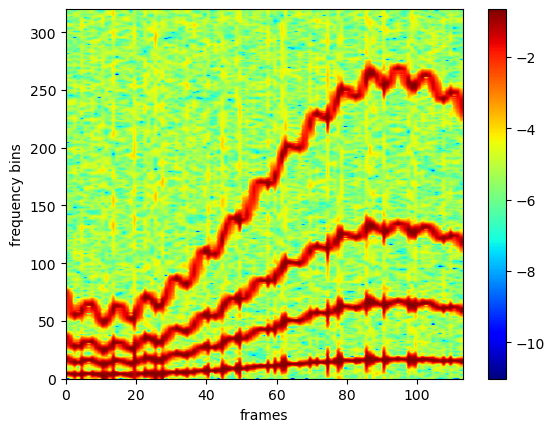

In [8]:
dstft = FDSTFT(x, win_length=577,  support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='t', win_min=100)
dstft.win_length.data = dstft.win_min + (dstft.win_max - dstft.win_min) * torch.rand(dstft.win_length.size(), device=device)
spec, stft, *_ = dstft(x)
dstft.print(spec, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)


with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\mathcal{R}_t$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\mathcal{R}_t$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\mathcal{R}_t$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\mathcal{R}_t$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

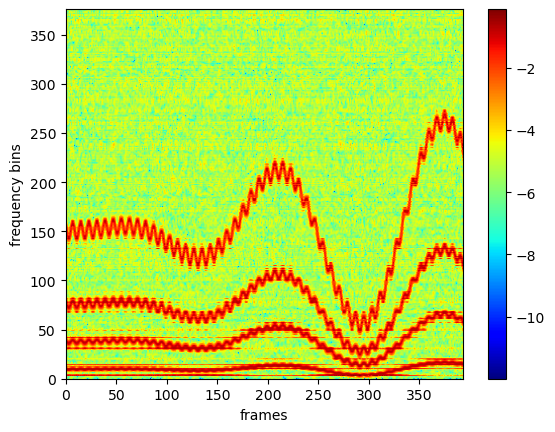

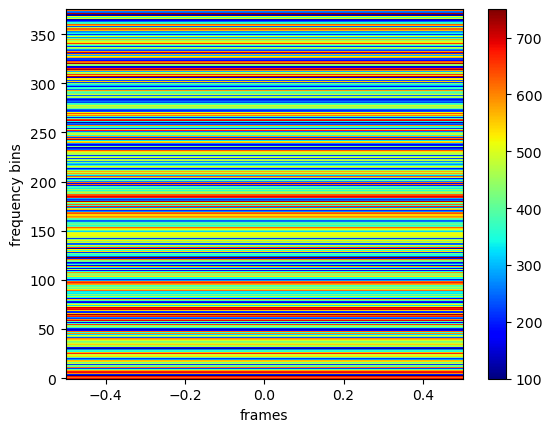

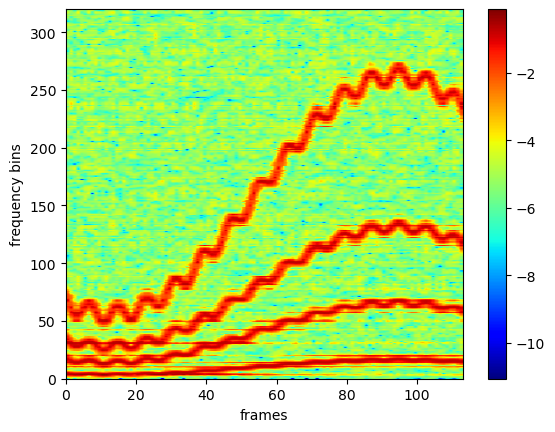

In [9]:
dstft = DSTFT(x, win_length=577,  support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='f', win_min=100)
dstft.win_length.data = dstft.win_min + (dstft.win_max - dstft.win_min) * torch.rand(dstft.win_length.size(), device=device)
spec, stft, *_ = dstft(x)
dstft.print(spec, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)


with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\mathcal{R}_f$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\mathcal{R}_f$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\mathcal{R}_f$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\mathcal{R}_f$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

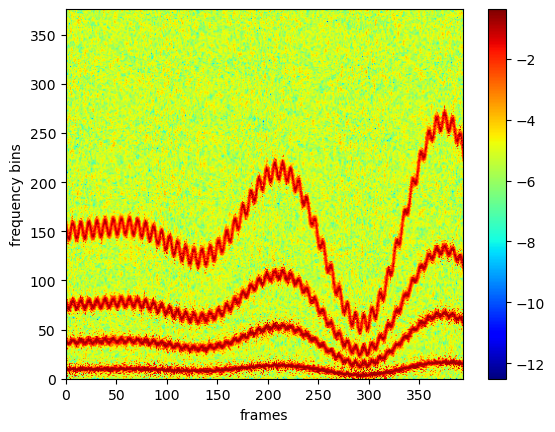

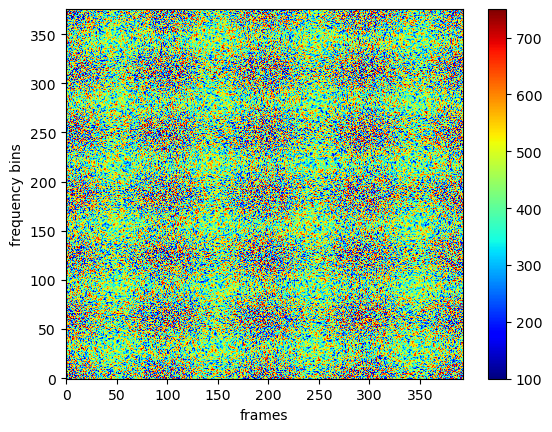

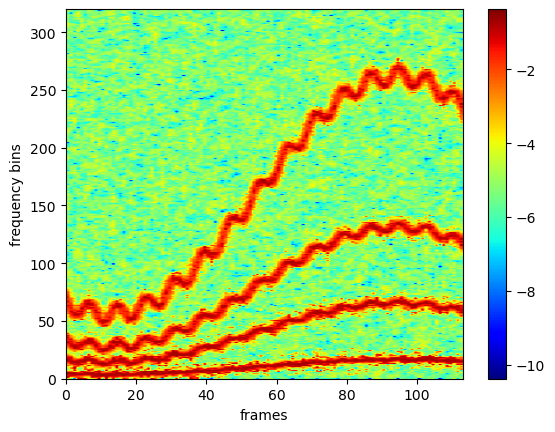

In [10]:
dstft = DSTFT(x, win_length=577,  support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
dstft.win_length.data = dstft.win_min + (dstft.win_max - dstft.win_min) * torch.rand(dstft.win_length.size(), device=device)
spec, stft, *_ = dstft(x)
dstft.print(spec, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)


with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\mathcal{R}_{tf}$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\mathcal{R}_{tf}$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\mathcal{R}_{tf}$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\mathcal{R}_{tf}$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

Time-varying window length

Epoch 00147: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00247: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00347: reducing learning rate of group 0 to 1.0000e-01.
346


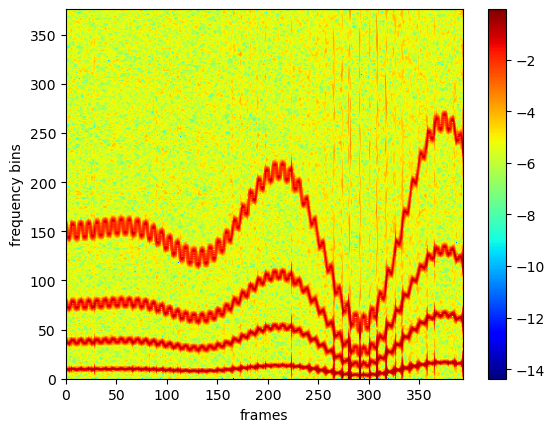

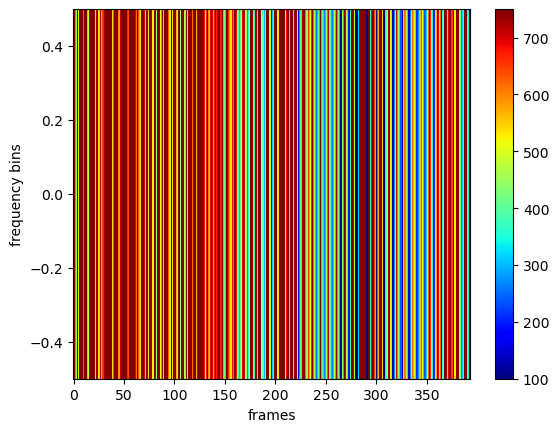

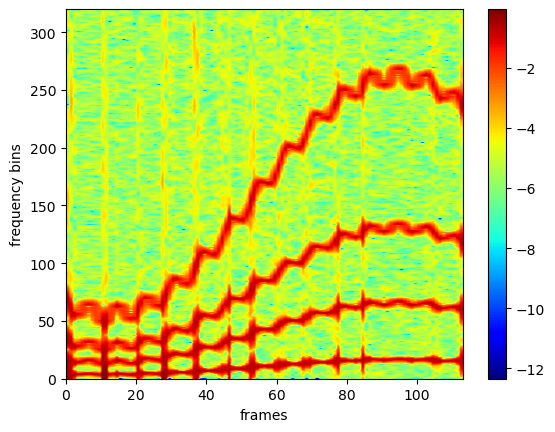

In [11]:
dstft = FDSTFT(x, win_length=577,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='t', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()    
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\theta_t$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\theta_t$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\theta_t$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\theta_t$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

Epoch 00102: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00237: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00340: reducing learning rate of group 0 to 1.0000e-01.
339


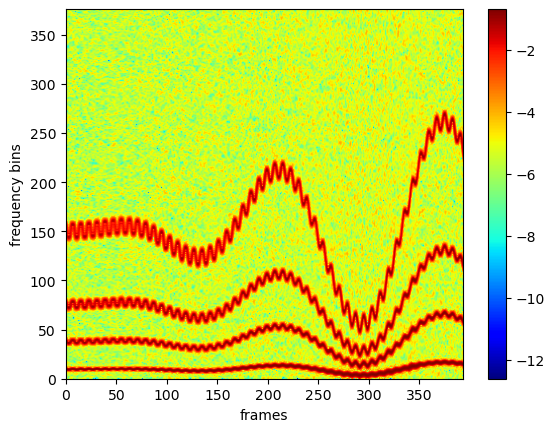

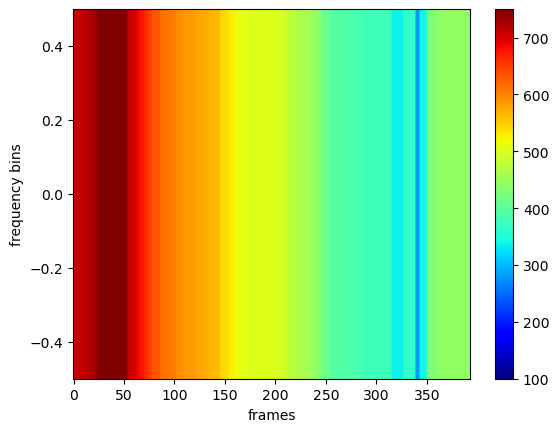

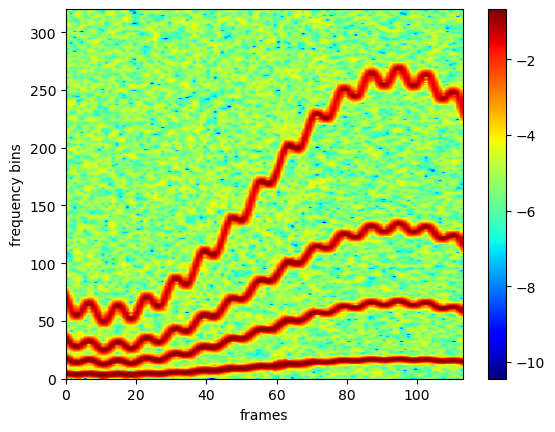

In [12]:
dstft = FDSTFT(x, win_length=277,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='t', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()    
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec) + 0.001 * (dstft.actual_win_length.diff(dim=1).pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break

print(epoch)
dstft.print(spec, x, bar=True, wins=False)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\tilde{\\theta}_t$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\tilde{\\theta}_t$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\tilde{\\theta}_t$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\tilde{\\theta}_t$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)

Frequency-varying window length

In [13]:
dstft = DSTFT(x, win_length=577,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='f', win_min=100)
params = [{'params': dstft.win_length,    'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\theta_f$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\theta_f$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\theta_f$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\theta_f$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)



KeyboardInterrupt: 

Epoch 00101: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00201: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00301: reducing learning rate of group 0 to 1.0000e-01.
300


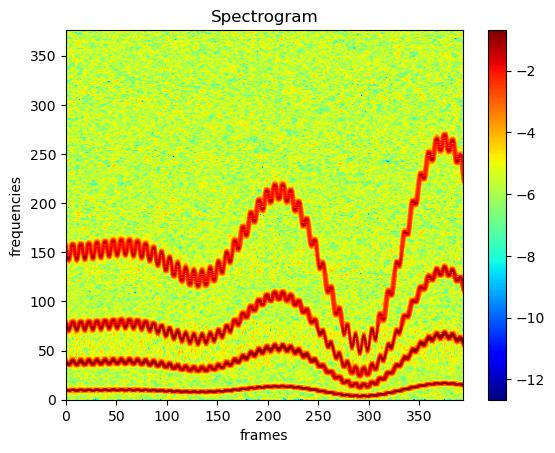

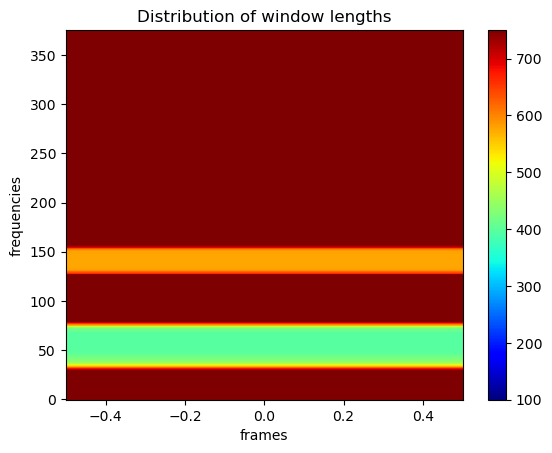

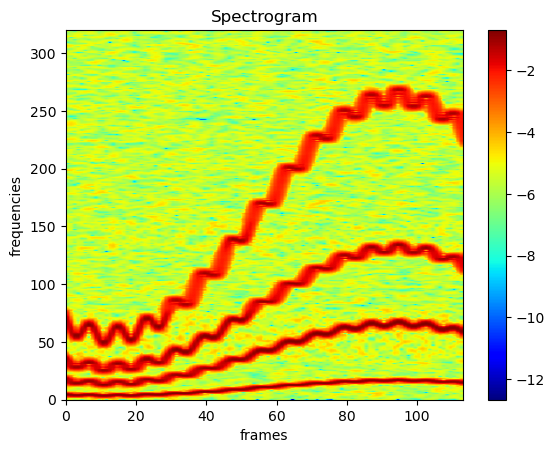

In [ ]:
dstft = DSTFT(x, win_length=577,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='f', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ]
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec) + 0.1 * (dstft.actual_win_length.diff(dim=0).pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, wins=False, bar=True)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\tilde{\\theta}_f$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\tilde{\\theta}_f$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\tilde{\\theta}_f$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\tilde{\\theta}_f$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)



Time-and-frequency-varying window length

Epoch 00157: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00260: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00360: reducing learning rate of group 0 to 1.0000e-01.
359


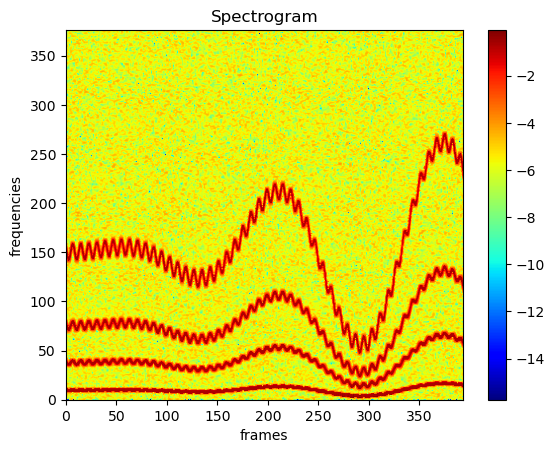

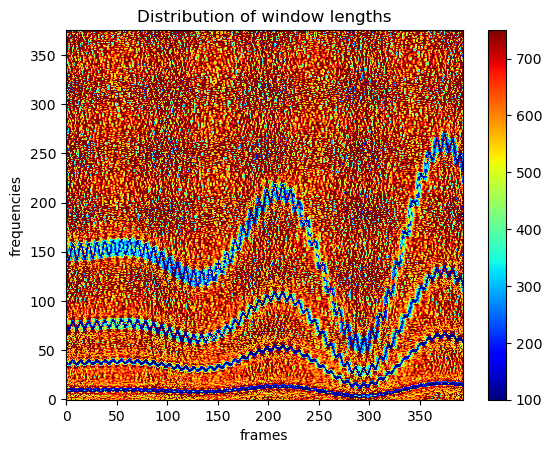

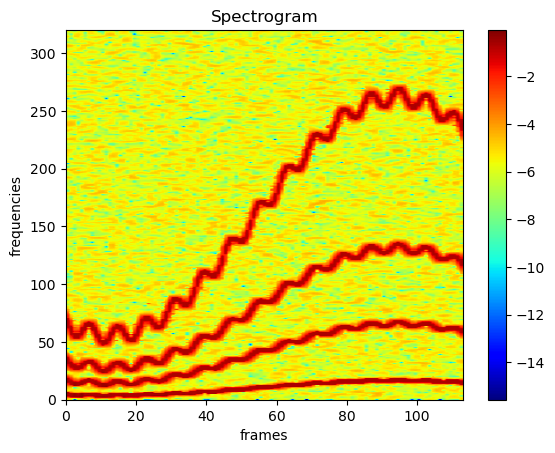

In [ ]:
dstft = DSTFT(x, win_length=577,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length, 'lr': 100.0},  ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\theta_{tf}$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\theta_{tf}$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\theta_{tf}$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\theta_{tf}$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)



Epoch 00137: reducing learning rate of group 0 to 1.0000e+01.
Epoch 00275: reducing learning rate of group 0 to 1.0000e+00.
Epoch 00391: reducing learning rate of group 0 to 1.0000e-01.
390


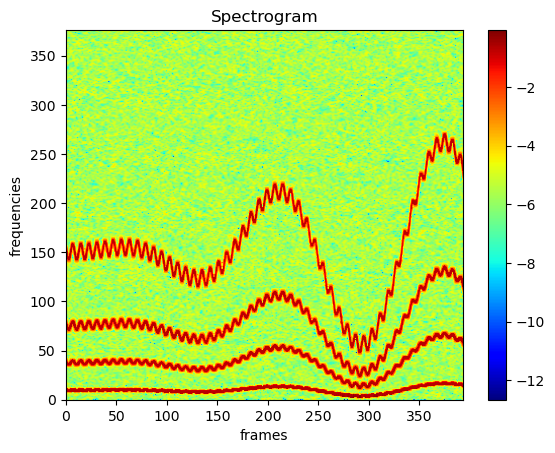

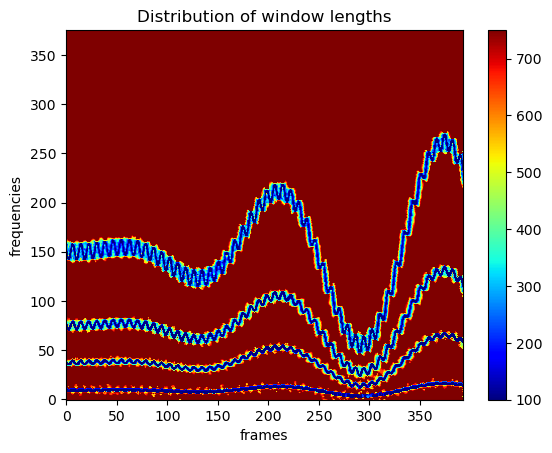

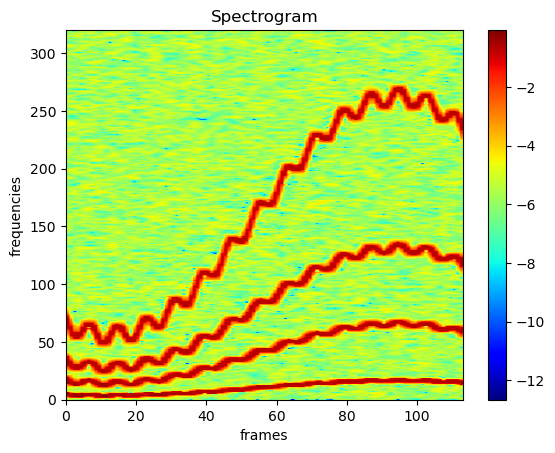

In [ ]:
dstft = DSTFT(x, win_length=577,   support=support, stride=stride, win_requires_grad=True, stride_requires_grad=False, win_p='tf', win_min=100)
params = [{'params': dstft.win_length,'lr': 100.0}, ] 
opt = torch.optim.Adam(params)
sch = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, mode='min', factor=.1, patience=99, verbose=True)

for epoch in range(1_000):
    opt.zero_grad()
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec) + 0.005 * (dstft.actual_win_length.diff(dim=0)[:, :-1].pow(2) + dstft.actual_win_length.diff(dim=1)[:-1].pow(2) + torch.finfo(x.dtype).eps).sqrt().mean()
    err.backward()
    opt.step()
    sch.step(err)
    
    if opt.param_groups[0]['lr'] < 1:
        break
    
print(epoch)
dstft.print(spec, x, bar=True, wins=False)
dstft.print(spec[:, :320, 280:410], x, bar=True, wins=False, weights=False)

with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
specs['$\\tilde{\\theta}_{tf}$'] = spec.detach().cpu()
with open("../tmp/3_specs.pkl", "wb") as file: pickle.dump(specs, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
stfts['$\\tilde{\\theta}_{tf}$'] = stft.detach().cpu()
with open("../tmp/3_stfts.pkl", "wb") as file: pickle.dump(stfts, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
wins['$\\tilde{\\theta}_{tf}$'] = dstft.actual_win_length.mean().detach().cpu()
with open("../tmp/3_wins.pkl", "wb") as file: pickle.dump(wins, file, pickle.HIGHEST_PROTOCOL)
    
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
losses['$\\tilde{\\theta}_{tf}$'] = entropy_loss(spec).detach().cpu().item()
with open("../tmp/3_losses.pkl", "wb") as file: pickle.dump(losses, file, pickle.HIGHEST_PROTOCOL)



Synchrosqueezing

In [ ]:
with open("../tmp/3_stfts.pkl", "rb") as file: stfts = pickle.load(file)
with open("../tmp/3_ss.pkl", "rb") as file: ss = pickle.load(file)
with open("../tmp/3_losses2.pkl", "rb") as file: losses2 = pickle.load(file)

for key, stft in stfts.items():
    z = fast_sst(stft[0], 10, stft.shape[-2], stft.shape[-1], .2, device)
    ss[key] = z
    losses2[key] = entropy_loss(z).detach().cpu().item()
    
with open("../tmp/3_ss.pkl", "wb") as file: pickle.dump(ss, file, pickle.HIGHEST_PROTOCOL)
with open("../tmp/3_losses2.pkl", "wb") as file: pickle.dump(losses2, file, pickle.HIGHEST_PROTOCOL)

/home/maxime/Documents/Projects/MyProjects/dstft/dstft/synchrosqueeze.py:21: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at /opt/conda/conda-bld/pytorch_1682343995026/work/aten/src/ATen/native/Copy.cpp:276.)
  Z_Ts[eta, b] = Z_Ts[eta, b] + torch.mean(X[k, b])


Loss

473


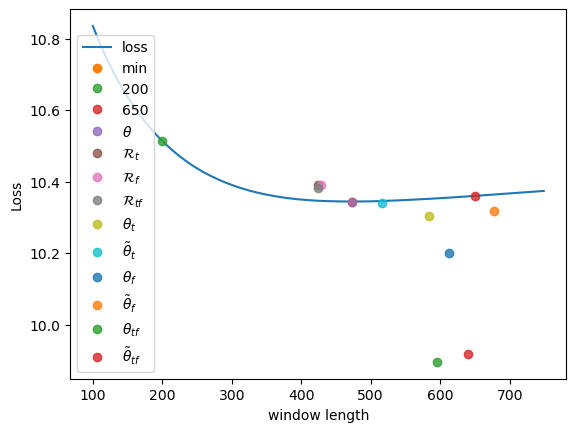

In [ ]:
loss_function = []
min_err = 100
min_win = 0

for win_length in range(100, support, 1):
    dstft = FDSTFT(x, win_length=win_length, support=support, stride=stride, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    loss_function.append(err.cpu())
    
print(min_win)
plt.plot(range(100, support, 1), loss_function, label='loss')
plt.plot(min_win, min_err.cpu(), 'o', label='min')

with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
for key, loss in losses.items():
    plt.plot(wins[key], loss, 'o', alpha=.8, label=key)
plt.xlabel('window length')
plt.ylabel('Loss')
plt.legend()
plt.show()

473


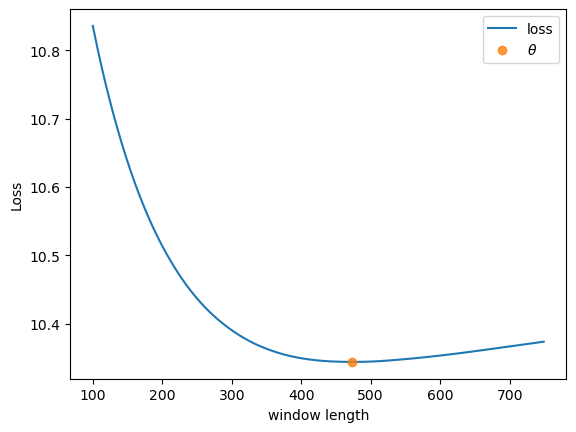

In [ ]:
loss_function = []
min_err = 100
min_win = 0

for win_length in range(100, support, 1):
    dstft = FDSTFT(x, win_length=win_length, support=support, stride=stride, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    loss_function.append(err.cpu())
    
print(min_win)
plt.plot(range(100, support, 1), loss_function, label='loss')
#plt.plot(min_win, min_err.cpu(), 'o', label='min')

with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
plt.plot(wins['$\\theta$'], losses['$\\theta$'], 'o', alpha=.8, label='$\\theta$')
plt.xlabel('window length')
plt.ylabel('Loss')
plt.legend()
plt.show()

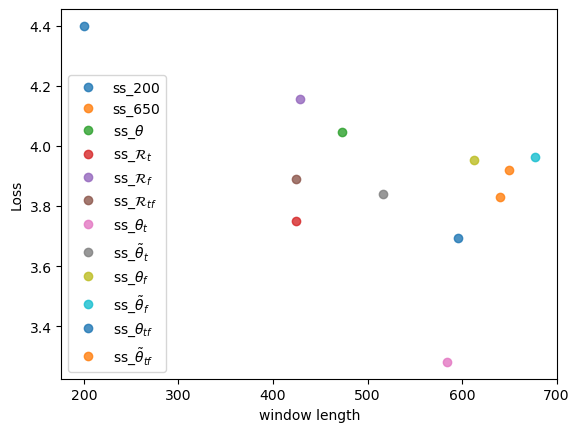

In [ ]:
with open("../tmp/3_losses2.pkl", "rb") as file: losses2 = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
for key, loss in losses2.items(): plt.plot(wins[key], loss, 'o', alpha=.8, label=f'ss_{key}')
plt.xlabel('window length')
plt.ylabel('Loss')
plt.legend()
plt.show()

473


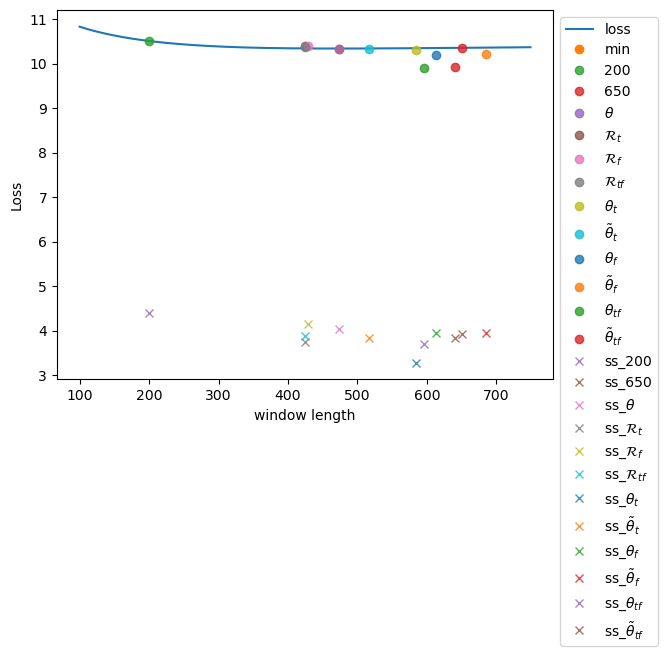

In [ ]:
loss_function = []
min_err = 100
min_win = 0

for win_length in range(100, support, 1):
    dstft = FDSTFT(x, win_length=win_length, support=support, stride=100, win_requires_grad=False, stride_requires_grad=False, win_p=None, stride_p=None)
    spec, stft, *_ = dstft(x)
    err = entropy_loss(spec)
    
    if err < min_err:
        min_err = err
        min_win = win_length
    loss_function.append(err.cpu())
    
print(min_win)
plt.plot(range(100, support, 1), loss_function, label='loss')
plt.plot(min_win, min_err.cpu(), 'o', label='min')

with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
with open("../tmp/3_losses2.pkl", "rb") as file: losses2 = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
for key, loss in losses.items(): plt.plot(wins[key], loss, 'o', alpha=.8, label=key)
for key, loss in losses2.items(): plt.plot(wins[key], loss, 'x', alpha=.8, label=f'ss_{key}')
plt.legend(bbox_to_anchor=(1, 1))
plt.xlabel('window length')
plt.ylabel('Loss')
plt.show()

['200', '650', '$\\theta$', '$\\mathcal{R}_t$', '$\\mathcal{R}_f$', '$\\mathcal{R}_{tf}$', '$\\theta_t$', '$\\tilde{\\theta}_t$', '$\\theta_f$', '$\\tilde{\\theta}_f$', '$\\theta_{tf}$', '$\\tilde{\\theta}_{tf}$']
[10.513558387756348, 10.359872817993164, 10.344188690185547, 10.3909912109375, 10.390621185302734, 10.381980895996094, 10.303905487060547, 10.340303421020508, 10.201027870178223, 10.316774368286133, 9.895403861999512, 9.918331146240234]


(9.0, 11.039236307144165)

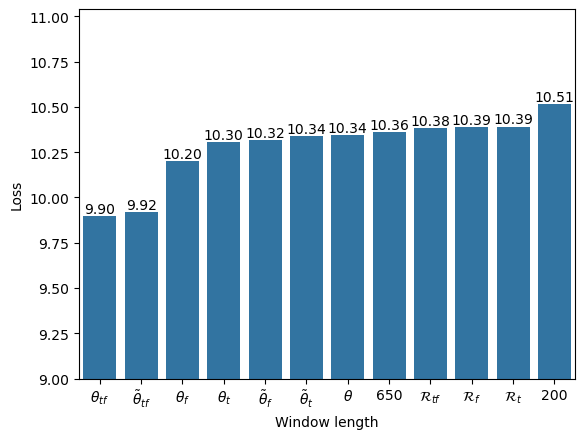

In [ ]:
keys = ['$\\theta$', 'random', 't2']
with open("../tmp/3_losses.pkl", "rb") as file: losses = pickle.load(file)
keys = list(losses.keys())
values = list(losses.values())
print(keys)
print(values)
df = pd.DataFrame({"Window length":keys, "Loss":values})

df.sort_values(by="Loss", axis=0, inplace=True)
df.head()
ax = sns.barplot(y='Loss', data=df, x="Window length")
ax.bar_label(ax.containers[0], fontsize=10, fmt='%.2f'); 
ax.set_ylim(9)


Plot

200


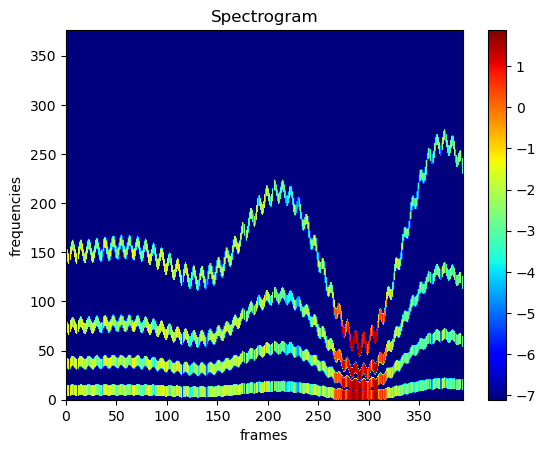

650


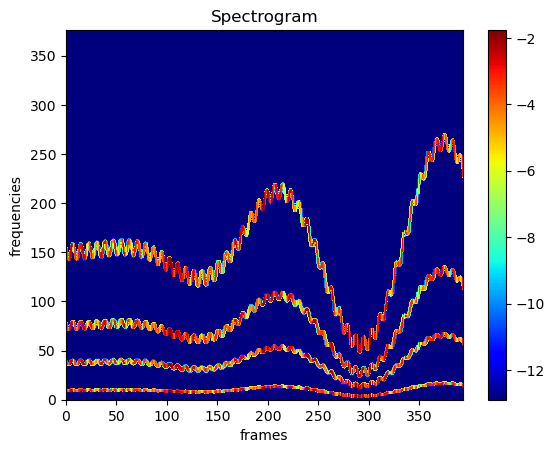

$\theta$


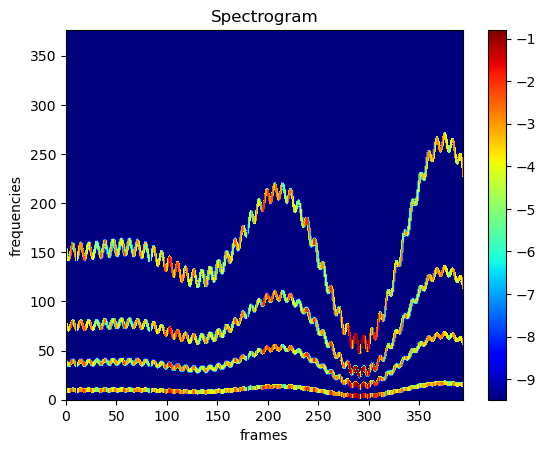

$\mathcal{R}_t$


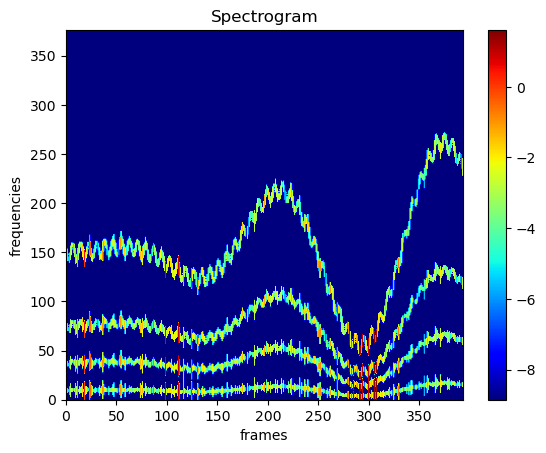

$\mathcal{R}_f$


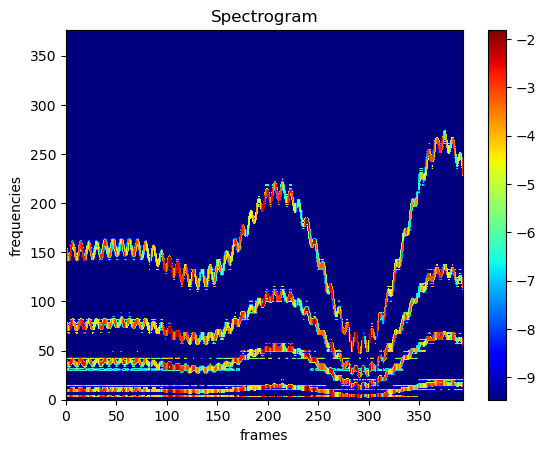

$\mathcal{R}_{tf}$


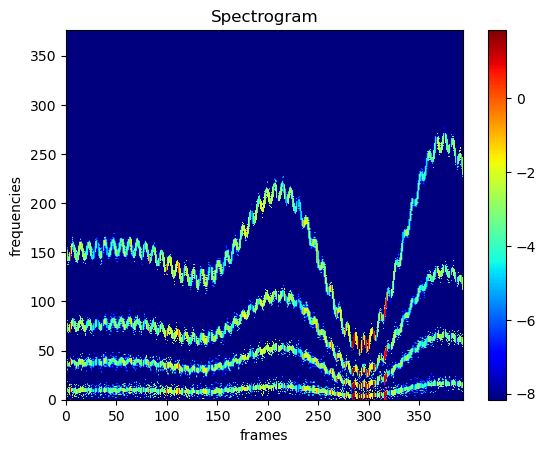

$\theta_t$


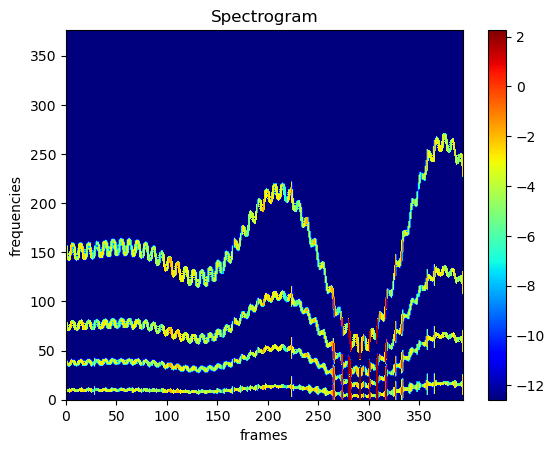

$\tilde{\theta}_t$


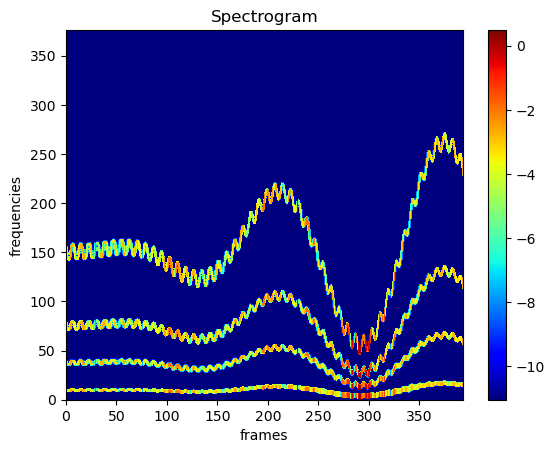

$\theta_f$


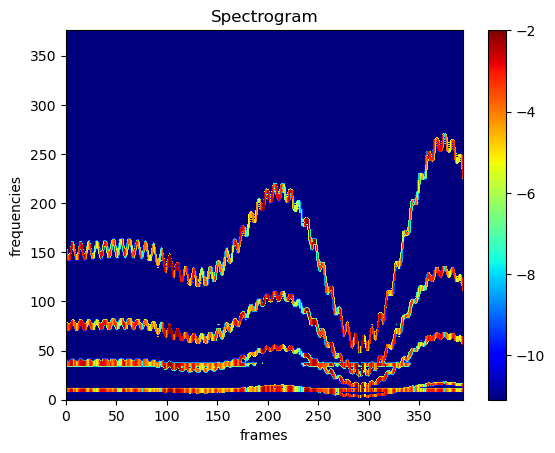

$\tilde{\theta}_f$


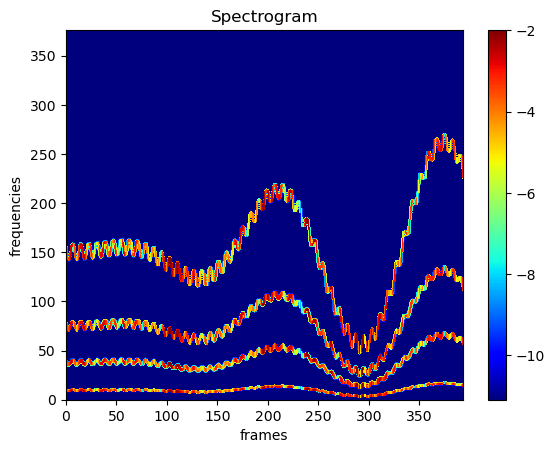

$\theta_{tf}$


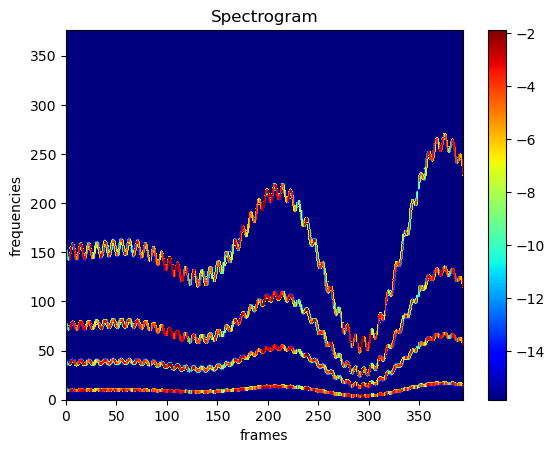

$\tilde{\theta}_{tf}$


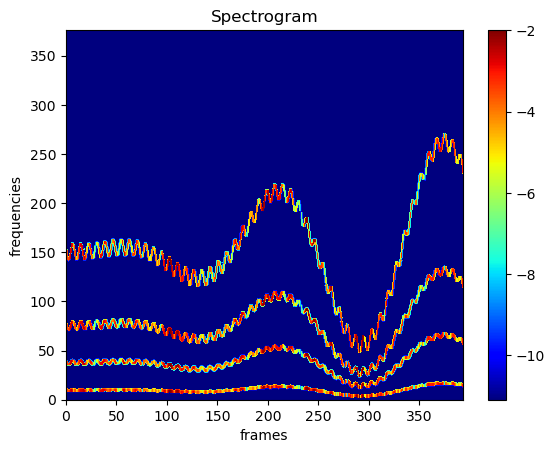

In [ ]:
with open("../tmp/3_ss.pkl", "rb") as file: ss = pickle.load(file)
for key, z in ss.items(): print(key); dstft.print(z[None, ...], x, bar=True, wins=False, weights=False)

200


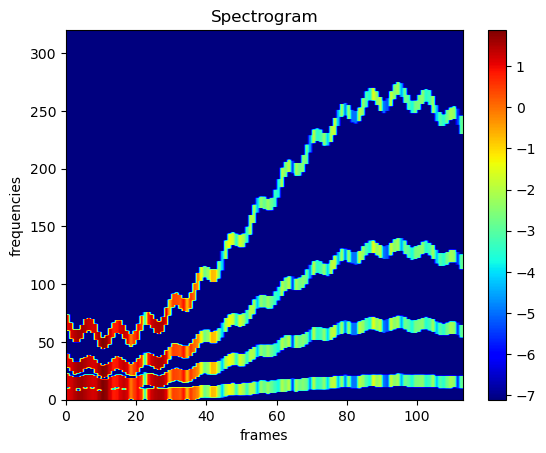

650


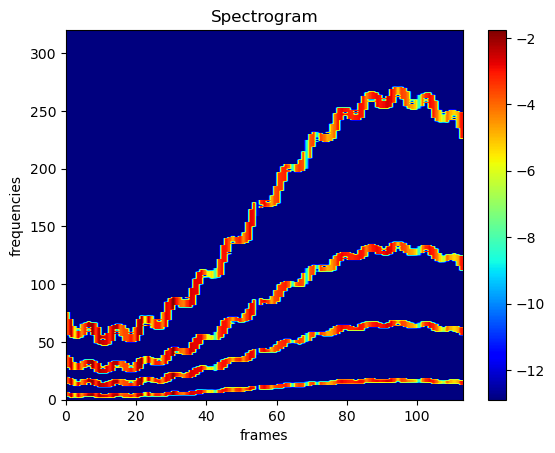

$\theta$


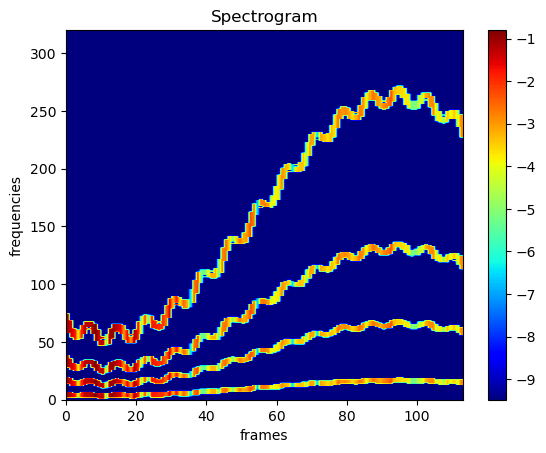

$\mathcal{R}_t$


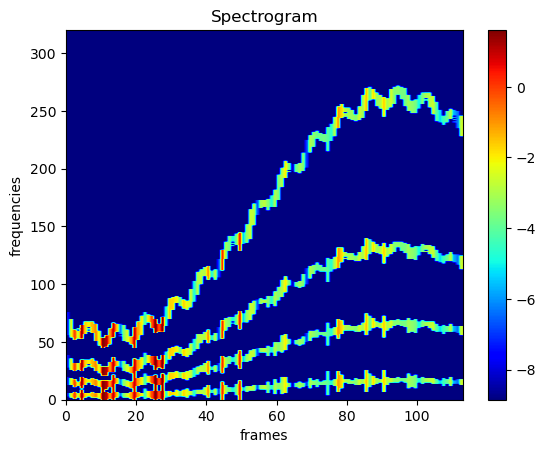

$\mathcal{R}_f$


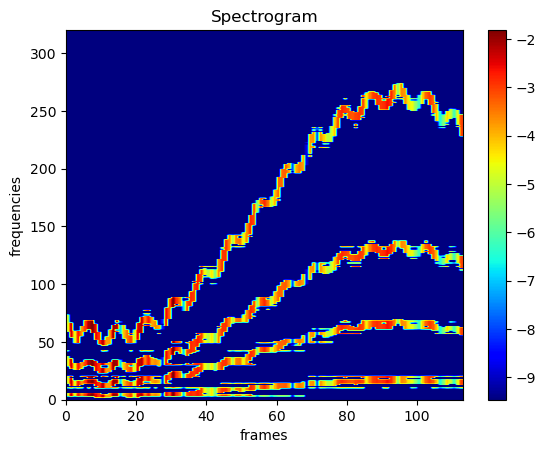

$\mathcal{R}_{tf}$


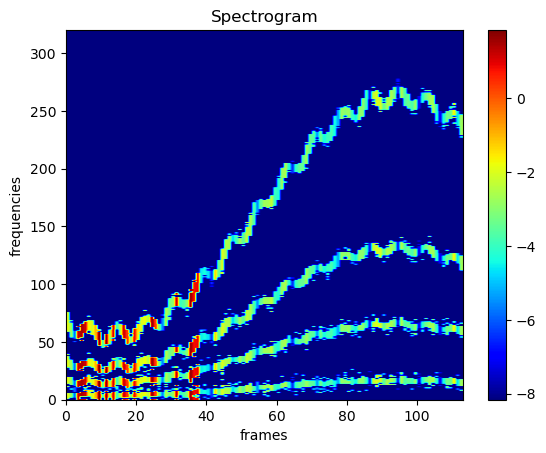

$\theta_t$


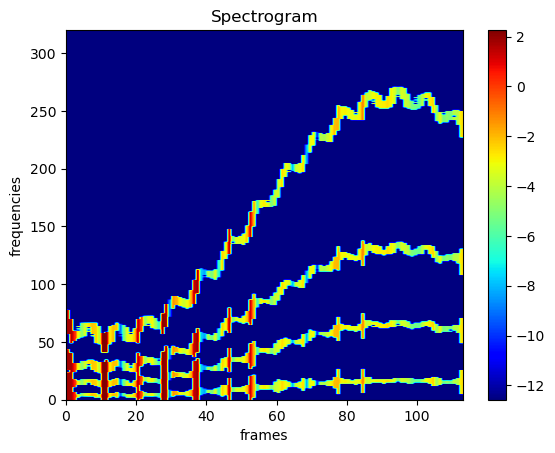

$\tilde{\theta}_t$


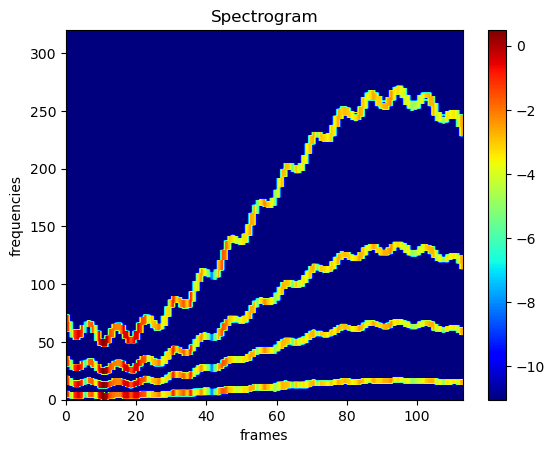

$\theta_f$


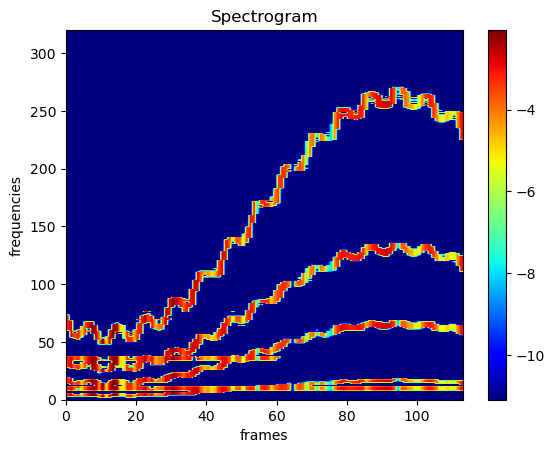

$\tilde{\theta}_f$


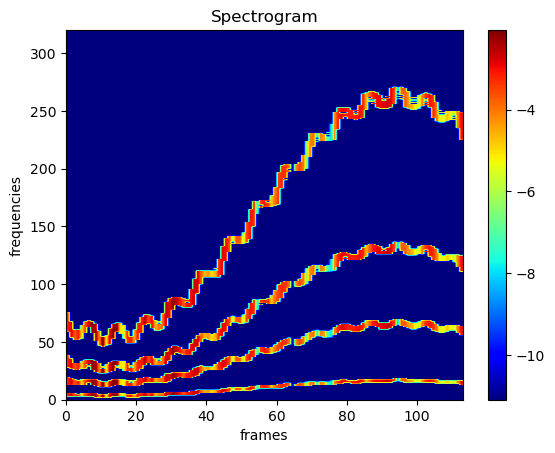

$\theta_{tf}$


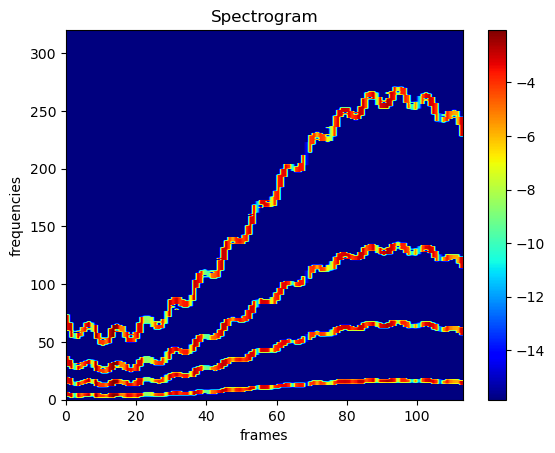

$\tilde{\theta}_{tf}$


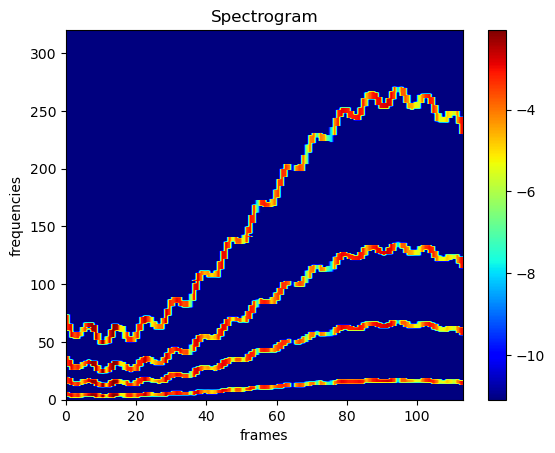

In [ ]:
with open("../tmp/3_ss.pkl", "rb") as file: ss = pickle.load(file)
for key, z in ss.items(): print(key); dstft.print(z[None, :320, 280:410], x, bar=True, wins=False, weights=False)

$\hat{f}$

In [ ]:
with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
with open("../tmp/3_f_hats.pkl", "rb") as file: f_hats = pickle.load(file)
for key, spec in specs.items():
    print(key, spec.shape)
    f_hat, out = frequency_tracking(y=x, fs=sr, spec=spec[0].to(device), fmin=0, fmax=.1*sr, alpha=1e10, orders=[4, 8, 16])
    f_hats[key] = out
    # f_hat = torch.nn.functional.interpolate((out*fs/2/spec.shape[0])[None, None, None, ...], size=x[0].shape[-1], mode='bicubic').squeeze()[0]
with open("../tmp/3_f_hats.pkl", "wb") as file: pickle.dump(f_hats, file, pickle.HIGHEST_PROTOCOL)

200 torch.Size([1, 376, 393])


IndexError: The shape of the mask [377] at index 0 does not match the shape of the indexed tensor [376] at index 0

In [ ]:
with open("../tmp/3_ss.pkl", "rb") as file: ss = pickle.load(file)
with open("../tmp/3_f_hats2.pkl", "rb") as file: f_hats = pickle.load(file)
for key, z in ss.items():
    print(key)
    f_hat, out = frequency_tracking(y=x, fs=sr, spec=z.to(device), fmin=0, fmax=.3*sr, alpha=1e10, orders=[4, 8, 16])
    f_hats[key] = out.cpu()

with open("../tmp/3_f_hats2.pkl", "wb") as file: pickle.dump(f_hats, file, pickle.HIGHEST_PROTOCOL)

200


IndexError: The shape of the mask [377] at index 0 does not match the shape of the indexed tensor [376] at index 0

In [ ]:
with open("../tmp/3_specs.pkl", "rb") as file: specs = pickle.load(file)
with open("../tmp/3_f_hats.pkl", "rb") as file: f_hats = pickle.load(file)

for key, out in f_hats.items(): 
    print(key)    
    plt.figure()
    plt.title(f'Spectrogram {key}')
    ax = plt.subplot()
    im = ax.imshow(specs[key][0].log(), aspect='auto', origin='lower', cmap='viridis', extent=[0,spec.shape[-1], 0, spec.shape[-2]])
    plt.ylabel('frequencies')
    plt.xlabel('frames')
    plt.colorbar(im, ax=ax)
    plt.plot(out.cpu(),  'r--', linewidth=2)
    plt.show()

In [ ]:
with open("../tmp/3_ss.pkl", "rb") as file: ss = pickle.load(file)
with open("../tmp/3_f_hats2.pkl", "rb") as file: f_hats = pickle.load(file)

for key, out in f_hats.items(): 
    print(key)    
    plt.figure()
    plt.title(f'Synchrosqueeze {key}')
    ax = plt.subplot()
    im = ax.imshow(ss[key].log(), aspect='auto', origin='lower', cmap='viridis', extent=[0,spec.shape[-1], 0, spec.shape[-2]])
    plt.ylabel('frequencies')
    plt.xlabel('frames')
    plt.colorbar(im, ax=ax)
    plt.plot(out.cpu(), 'r--', linewidth=2)
    plt.show()

In [ ]:
f_sub = f[(support-1)//2:-(support-1)//2].unfold(0, 1, stride).flatten()
print(f_sub.shape)

In [ ]:
with open("../tmp/3_f_hats.pkl", "rb") as file: f_hats = pickle.load(file)
for key, out in f_hats.items(): 
    f_hat = out * sr / support 
    plt.plot(f_hat.cpu(), label=key)
plt.plot(f_sub, label='ground truth')
plt.legend()

plt.figure()
with open("../tmp/3_f_hats2.pkl", "rb") as file: f_hats = pickle.load(file)
for key, out in f_hats.items(): 
    f_hat = out * sr / support 
    plt.plot(f_hat, label=key)
plt.plot(f_sub, label='ground truth')

In [ ]:
with open("../tmp/3_f_hats.pkl", "rb") as file: f_hats = pickle.load(file)
with open("../tmp/3_mse.pkl", "rb") as file: mse = pickle.load(file)
mse = {}

for key, out in f_hats.items(): 
    f_hat = out * sr / support 
    mse[key] = torch.nn.functional.mse_loss(f_hat, f_sub).item()
    print(key, mse[key])

with open("../tmp/3_mse.pkl", "wb") as file: pickle.dump(mse, file, pickle.HIGHEST_PROTOCOL)

with open("../tmp/3_f_hats2.pkl", "rb") as file: f_hats = pickle.load(file)
with open("../tmp/3_mse2.pkl", "rb") as file: mse = pickle.load(file)
mse = {}

for key, out in f_hats.items(): 
    f_hat = out * sr / support 
    mse[key] = torch.nn.functional.mse_loss(f_hat, f_sub).item()
    print(key, mse[key])

with open("../tmp/3_mse2.pkl", "wb") as file: pickle.dump(mse, file, pickle.HIGHEST_PROTOCOL)


In [ ]:
with open("../tmp/3_mse.pkl", "rb") as file: mses = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
for key, mse in mses.items(): plt.plot(wins[key][0], mse, 'o', alpha=.8, label=f'{key}')
plt.legend()
plt.show()

In [ ]:
with open("../tmp/3_mse2.pkl", "rb") as file: mses = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
for key, mse in mses.items(): plt.plot(wins[key][0], mse, 'o', alpha=.8, label=f'ss_{key}')
plt.legend()
plt.show()

In [ ]:
with open("../tmp/3_mse.pkl", "rb") as file: mses = pickle.load(file)
with open("../tmp/3_mse2.pkl", "rb") as file: mses2 = pickle.load(file)
with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)
for key, mse in mses.items(): plt.plot(wins[key][0], mse, 'o', alpha=.8, label=key)
for key, mse in mses2.items(): plt.plot(wins[key][0], mse, 'x', alpha=.8, label=f'ss_{key}')
plt.legend(bbox_to_anchor=(1.25, 1))
plt.show()

In [ ]:
with open("../tmp/3_mse.pkl", "rb") as file: mses = pickle.load(file)
with open("../tmp/3_mse2.pkl", "rb") as file: mses2 = pickle.load(file)
#with open("../tmp/3_wins.pkl", "rb") as file: wins = pickle.load(file)

min_mse = 100; min_key = None
for key, mse in mses.items(): 
    if mse < min_mse:
        min_mse = mse
        min_key = key
print(min_mse, min_key)
    
min_mse = 100; min_key = None
for key, mse in mses2.items(): 
    if mse < min_mse:
        min_mse = mse
        min_key = key
print(min_mse, min_key)

In [ ]:
keys = ['$\\theta$', 'random', 't2']
with open("../tmp/3_mse.pkl", "rb") as file: mses = pickle.load(file)
keys = list(mses.keys())
values = list(mses.values())

df = pd.DataFrame({"Window length":keys, "Loss":values})

df.sort_values(by="Loss", axis=0, inplace=True)
df.head()
ax = sns.barplot(y='Loss', data=df, x="Window length")#or hue='Method
ax.bar_label(ax.containers[0], fontsize=10, fmt='%.2f'); 
    
plt.figure()
keys = ['$\\theta$', 'random', 't2']
with open("../tmp/3_mse2.pkl", "rb") as file: mses = pickle.load(file)
keys = list(mses.keys())
values = list(mses.values())

df = pd.DataFrame({"Window length":keys, "Loss":values})

df.sort_values(by="Loss", axis=0, inplace=True)
df.head()
ax = sns.barplot(y='Loss', data=df, x="Window length")#or hue='Method
ax.bar_label(ax.containers[0], fontsize=10, fmt='%.2f'); 